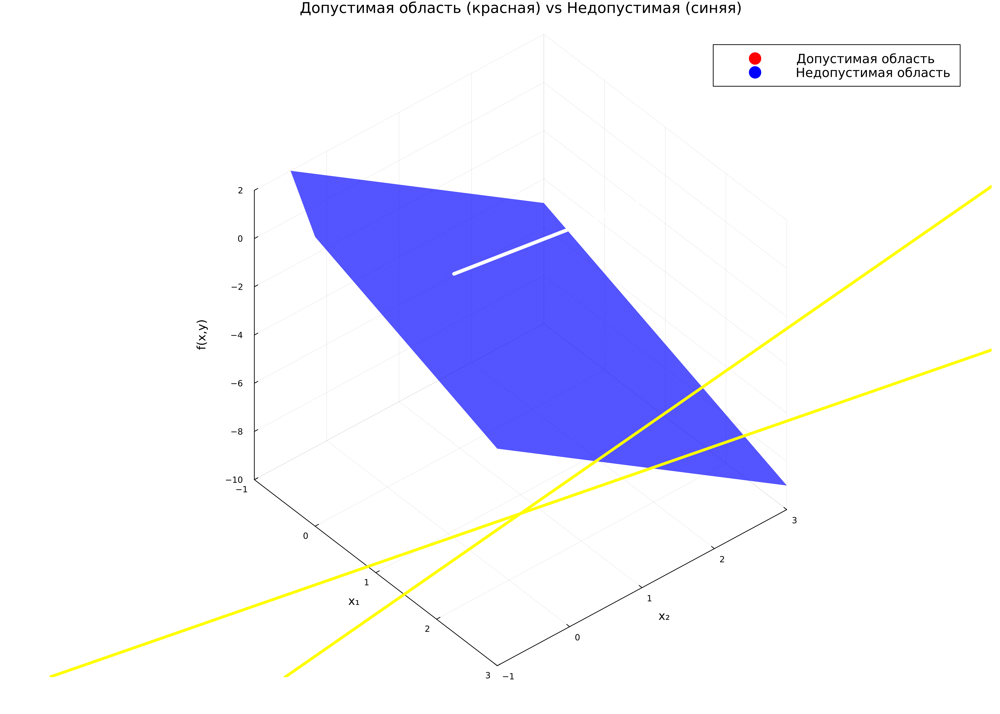

In [ ]:
using Plots

# Функция и параметры
f(x,y) = -x - 2y
x = range(-1, 3, length=200)  # Увеличили разрешение
y = range(-1, 3, length=200)
grad = [1, 2]

# Функция определения допустимой области
function is_feasible(x,y)
    (y ≥ x - 1) && (y ≥ (x-1)/2) && (x ≥ 0) && (y ≥ 0)
end

# Создаем график с правильными параметрами
plt = plot(size=(1400, 1000), title=raw"Допустимая область (красная) и недопустимая (синяя)",
           xlabel="x₁", ylabel="x₂", zlabel="f(x,y)", 
           legend=:topright, camera=(50, 40),
           zlims=(-10,2), xlims=(-1,3), ylims=(-1,3))

# 1. Сначала рисуем синюю (недопустимую) область
surface!(plt, x, y, (x,y)->is_feasible(x,y) ? NaN : f(x,y), 
        color=:blue, alpha=0.6)

# 2. Затем рисуем красную (допустимую) область поверх
surface!(plt, x, y, (x,y)->is_feasible(x,y) ? f(x,y) : NaN,
        color=:red, alpha=0.8)

# 3. Яркие границы между областями
contour!(plt, x, y, (x,y)->is_feasible(x,y) ? 1 : 0,
        levels=[0.5], linewidth=4, c=:yellow)

# 4. Антиградиент для наглядности
quiver!(plt, [0.5], [0.5], [f(0.5,0.5)+0.5], 
       quiver=([grad[1]], [grad[2]], [2]), 
       color=:white, linewidth=5)

# Настройки отображения
plot!(plt, legendfontsize=12, dpi=300, 
     colorbar=false, gridalpha=0.3)